In [2]:
# Visualize License Plate Detection Data
# แสดงภาพต้นฉบับพร้อม bounding boxes และภาพป้ายทะเบียนที่ครอป

import pandas as pd
import numpy as np
from pathlib import Path
import ast
import cv2  # ใช้ OpenCV แทน PIL เพราะ handle Unicode paths ได้ดีกว่าบน Windows
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# Setup paths
DATA_DIR = Path(r"C:\Users\Tanaphat\Desktop\Coding\ALPR\data\8000")
CSV_PATH = DATA_DIR / "8000.csv"

# Load CSV
df = pd.read_csv(CSV_PATH)
df_valid = df[df['is_validate'] == True].copy()

print(f"Total valid samples: {len(df_valid)}")
print(f"Will visualize first 10 samples")

Total valid samples: 8172
Will visualize first 10 samples


In [3]:
def parse_bbox(bbox_str):
    """Parse bbox from string to coordinates"""
    try:
        bbox = ast.literal_eval(bbox_str)
        if isinstance(bbox, list) and len(bbox) > 0:
            return bbox[0]
        return None
    except:
        return None

def load_image_cv2(img_path):
    """
    Load image using cv2.imread() which handles Unicode paths better on Windows.
    Returns RGB numpy array.
    """
    # cv2.imread() ไม่ support Unicode paths โดยตรง ต้องใช้ np.fromfile()
    img_array = np.fromfile(str(img_path), dtype=np.uint8)
    img = cv2.imdecode(img_array, cv2.IMREAD_COLOR)
    
    if img is None:
        raise FileNotFoundError(f"Cannot load image: {img_path}")
    
    # แปลง BGR (OpenCV) เป็น RGB (Matplotlib)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return img

def fix_bbox_scale(car_bbox, plate_bbox, img_width):
    """
    Fix bounding box coordinates based on annotation tool bug.
    The tool resizes images to 480px and divides coords by ratio instead of multiplying.
    """
    if car_bbox is None or plate_bbox is None:
        return None, None
    
    # Calculate scale factor based on image width
    DISPLAY_WIDTH = 2560
    ratio = DISPLAY_WIDTH / float(img_width)
    SCALE_FACTOR = 1.0 / ratio  # img_width / 480
    
    # Fix car_bbox (full-image coordinates)
    car_x1, car_y1, car_x2, car_y2 = car_bbox
    car_x1 = car_x1 / SCALE_FACTOR
    car_y1 = car_y1 / SCALE_FACTOR
    car_x2 = car_x2 / SCALE_FACTOR
    car_y2 = car_y2 / SCALE_FACTOR
    
    # Fix plate_bbox (car-relative coordinates)
    px1, py1, px2, py2 = plate_bbox
    px1 = px1 / SCALE_FACTOR
    py1 = py1 / SCALE_FACTOR
    px2 = px2 / SCALE_FACTOR
    py2 = py2 / SCALE_FACTOR
    
    # Convert plate from car-relative to full-image coordinates
    px1 = px1 + car_x1
    py1 = py1 + car_y1
    px2 = px2 + car_x1
    py2 = py2 + car_y1
    
    return [car_x1, car_y1, car_x2, car_y2], [px1, py1, px2, py2]

print("Helper functions defined")

Helper functions defined


## ส่วนที่ 1: แสดงภาพเต็มพร้อม car_bbox และ plate_bbox

แสดง 10 รูปแรก พร้อม bounding boxes:

- **สีน้ำเงิน** = car_bbox (กรอบรถ)
- **สีแดง** = plate_bbox (กรอบป้ายทะเบียน)


C:\Users\Tanaphat\AppData\Local\Temp\ipykernel_55652\2492119407.py:60: UserWarning: Glyph 3585 (\N{THAI CHARACTER KO KAI}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
C:\Users\Tanaphat\AppData\Local\Temp\ipykernel_55652\2492119407.py:60: UserWarning: Glyph 3591 (\N{THAI CHARACTER NGO NGU}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
C:\Users\Tanaphat\AppData\Local\Temp\ipykernel_55652\2492119407.py:60: UserWarning: Glyph 3619 (\N{THAI CHARACTER RO RUA}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
C:\Users\Tanaphat\AppData\Local\Temp\ipykernel_55652\2492119407.py:60: UserWarning: Glyph 3634 (\N{THAI CHARACTER SARA AA}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
C:\Users\Tanaphat\AppData\Local\Temp\ipykernel_55652\2492119407.py:60: UserWarning: Glyph 3594 (\N{THAI CHARACTER CHO CHANG}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
C:\Users\Tanaphat\AppData\Local\Temp\ipykernel_55652\2492119407.py:60: UserWarning: Glyph 3610 (\N{THAI C

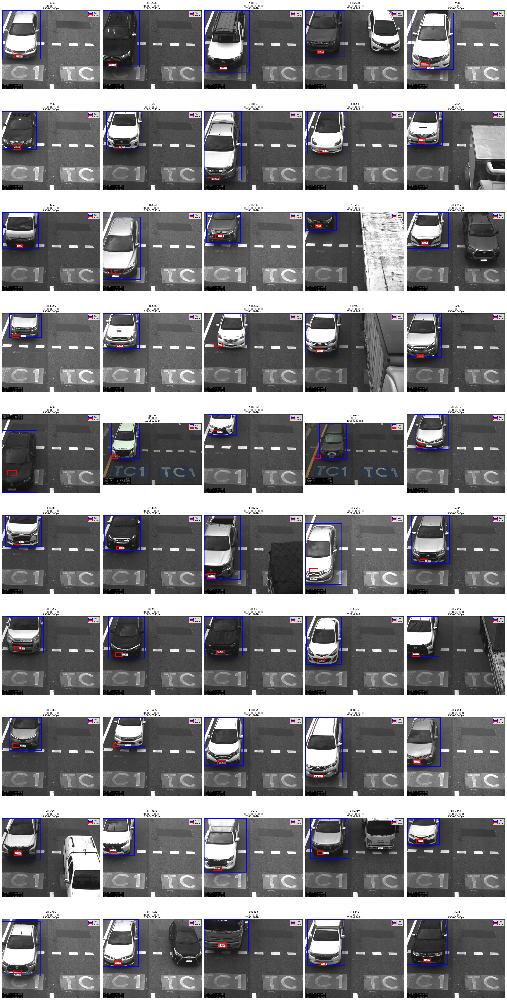

✓ Visualization 1 complete


In [9]:
# Visualization 1: Full images with bounding boxes
num_samples = 50
fig, axes = plt.subplots(10, 5, figsize=(30, 60))
axes = axes.flatten()

for i in range(min(num_samples, len(df_valid))):
    row = df_valid.iloc[i]
    
    # Construct image path
    img_path = DATA_DIR / row['image_name_gray'].lstrip('/')
    
    if not img_path.exists():
        print(f"File not found: {img_path}")
        axes[i].text(0.5, 0.5, f'File not found', ha='center', va='center')
        axes[i].axis('off')
        continue
    
    try:
        # Load image using cv2 (handles Unicode paths)
        img_array = load_image_cv2(img_path)
        h, w = img_array.shape[:2]
        
        # Parse bboxes
        car_bbox_raw = parse_bbox(row['car_bbox'])
        plate_bbox_raw = parse_bbox(row['plate_bbox'])
        
        # Fix scale
        car_bbox, plate_bbox = car_bbox_raw, plate_bbox_raw
        # car_bbox, plate_bbox = fix_bbox_scale(car_bbox_raw, plate_bbox_raw, w)
        
        # Display image
        axes[i].imshow(img_array)
        
        if car_bbox:
            cx1, cy1, cx2, cy2 = car_bbox
            car_rect = patches.Rectangle((cx1, cy1), cx2-cx1, cy2-cy1,
                                          linewidth=3, edgecolor='blue', facecolor='none',
                                          label='Car')
            axes[i].add_patch(car_rect)
        
        if plate_bbox:
            px1, py1, px2, py2 = plate_bbox
            plate_rect = patches.Rectangle((px1, py1), px2-px1, py2-py1,
                                           linewidth=3, edgecolor='red', facecolor='none',
                                           label='Plate')
            axes[i].add_patch(plate_rect)
        
        # Title with plate number
        plate_text = row.get('plate', 'N/A')
        province = row.get('province_description', 'N/A')
        axes[i].set_title(f"{plate_text}\n{province}\n{w}x{h}px", fontsize=10)
        axes[i].axis('off')
        axes[i].legend(loc='upper right', fontsize=8)
        
    except Exception as e:
        print(f"Error loading image {i}: {e}")
        axes[i].text(0.5, 0.5, f'Error: {str(e)}', ha='center', va='center', fontsize=8)
        axes[i].axis('off')

plt.tight_layout()
plt.show()

print("✓ Visualization 1 complete")

## ส่วนที่ 2: แสดงภาพป้ายทะเบียนที่ครอป

แสดง 10 รูปป้ายทะเบียนที่ครอปจากรูปเต็ม แสดง:

- เลขทะเบียน (plate number)
- จังหวัด (province)


C:\Users\Tanaphat\AppData\Local\Temp\ipykernel_55652\611274504.py:62: UserWarning: Glyph 3607 (\N{THAI CHARACTER THO THAHAN}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
C:\Users\Tanaphat\AppData\Local\Temp\ipykernel_55652\611274504.py:62: UserWarning: Glyph 3632 (\N{THAI CHARACTER SARA A}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
C:\Users\Tanaphat\AppData\Local\Temp\ipykernel_55652\611274504.py:62: UserWarning: Glyph 3648 (\N{THAI CHARACTER SARA E}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
C:\Users\Tanaphat\AppData\Local\Temp\ipykernel_55652\611274504.py:62: UserWarning: Glyph 3610 (\N{THAI CHARACTER BO BAIMAI}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
C:\Users\Tanaphat\AppData\Local\Temp\ipykernel_55652\611274504.py:62: UserWarning: Glyph 3637 (\N{THAI CHARACTER SARA II}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
C:\Users\Tanaphat\AppData\Local\Temp\ipykernel_55652\611274504.py:62: UserWarning: Glyph 3618 (\N{THAI CHAR

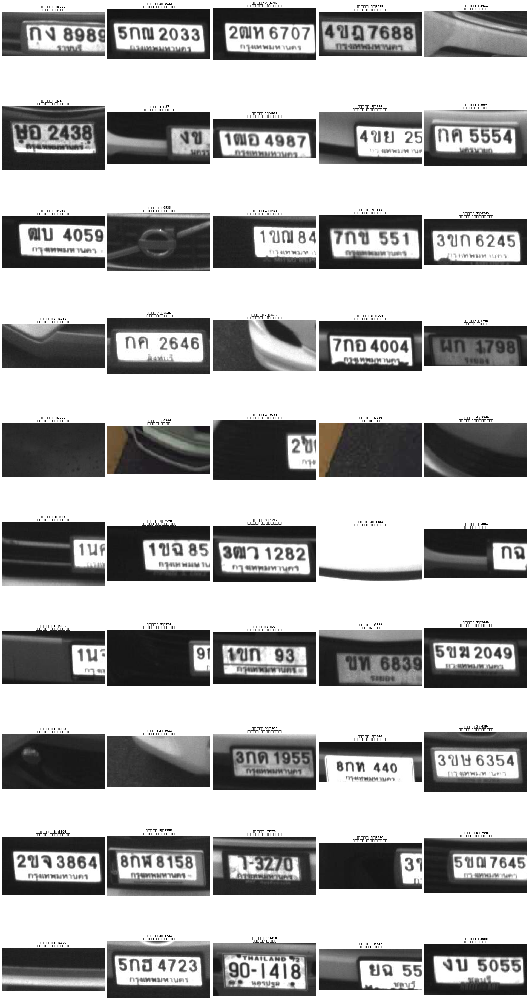

✓ Visualization 2 complete


In [10]:
# Visualization 2: Cropped license plate images
num_samples = 50
fig, axes = plt.subplots(10, 5, figsize=(30, 60))
axes = axes.flatten()

for i in range(min(num_samples, len(df_valid))):
    row = df_valid.iloc[i]
    
    # Construct image path
    img_path = DATA_DIR / row['image_name_gray'].lstrip('/')
    
    if not img_path.exists():
        axes[i].text(0.5, 0.5, f'File not found', ha='center', va='center')
        axes[i].axis('off')
        continue
    
    try:
        # Load image using cv2 (handles Unicode paths)
        img_array = load_image_cv2(img_path)
        h, w = img_array.shape[:2]
        
        # Parse and fix bboxes
        car_bbox_raw = parse_bbox(row['car_bbox'])
        plate_bbox_raw = parse_bbox(row['plate_bbox'])
        
        # Fix scale
        car_bbox, plate_bbox = car_bbox_raw, plate_bbox_raw
        # car_bbox, plate_bbox = fix_bbox_scale(car_bbox_raw, plate_bbox_raw, w)
        
        if plate_bbox:
            px1, py1, px2, py2 = plate_bbox
            
            # Ensure coordinates are within image bounds
            px1 = max(0, min(int(px1), w))
            py1 = max(0, min(int(py1), h))
            px2 = max(0, min(int(px2), w))
            py2 = max(0, min(int(py2), h))
            
            # Crop plate region
            plate_img = img_array[py1:py2, px1:px2]
            
            if plate_img.size > 0:
                axes[i].imshow(plate_img)
                
                # Title with plate info
                plate_text = row.get('plate', 'N/A')
                province = row.get('province_description', 'N/A')
                axes[i].set_title(f"ทะเบียน: {plate_text}\nจังหวัด: {province}", 
                                fontsize=11, weight='bold')
            else:
                axes[i].text(0.5, 0.5, 'Empty crop', ha='center', va='center')
        else:
            axes[i].text(0.5, 0.5, 'No plate bbox', ha='center', va='center')
        
        axes[i].axis('off')
        
    except Exception as e:
        print(f"Error processing image {i}: {e}")
        axes[i].text(0.5, 0.5, f'Error: {str(e)}', ha='center', va='center', fontsize=8)
        axes[i].axis('off')

plt.tight_layout()
plt.show()

print("✓ Visualization 2 complete")